# Cleaning and Feature Engineering

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
plt.style.use('ggplot')
import plotly.express as px
import seaborn as sns
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import warnings
warnings.filterwarnings('ignore')


pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [1]:
import time

In [2]:
def get_unique_values(df):
    for i in df.columns:
        print(i,set(np.unique(df[i])),'\n')
        
def type_(x):
    if len(x) == 0:
        t = 'Numerical'
    elif len(x) == 2:
        t = 'Binary Categorical'
    else:
        t = 'Categorical' 
    return t


################################################################# Data Dictionary For Housing Data


housing_dict = pd.read_csv('./data/data_description.txt',
                   sep="\n|:",
                   header=None,
                   engine='python')

housing_dict.columns = ['var','descr']

new_housing_dict = housing_dict.loc[~housing_dict['descr'].isnull()]

new_housing_dict.loc[0:,'index_'] = new_housing_dict.index

idx = new_housing_dict['index_'].to_numpy()
i = 0
indx_outcomes = []
while (i < len(idx)-1):
    indx_outcomes.append(np.arange(idx[i]+1,idx[i+1]))
    i += 1

associated_outcomes = []
for j in indx_outcomes:
    associated_outcomes.append(housing_dict[['var']].loc[j].to_numpy())
    
associated_outcomes.append(np.array([])) #append an empty array to fix length issue

associated_outcomes = pd.Series(associated_outcomes).\
                        apply(lambda outcome_set: [i[0] for i in outcome_set]).to_numpy()



new_housing_dict.loc[0:,'associated_outcomes'] = associated_outcomes
new_housing_dict = new_housing_dict.reset_index()
new_housing_dict = new_housing_dict.drop(['index','index_'], axis = 1)


types = [type_(elem) for elem in new_housing_dict['associated_outcomes']]
new_housing_dict.loc[0:,'Variable Type'] = types

housing_dict = new_housing_dict

def ghd():
    return(housing_dict.sort_values(by = "var"))

# Reading in Housing Data

In [3]:
housing = pd.read_csv('./data/Ames_Housing_Price_Data.csv')
housing.rename(columns = {'PID':'MapRefNo'}, inplace = True) # renaming to later merge res and housing on this column
housing = housing.drop('Unnamed: 0', axis = 1)
housing.shape

(2580, 81)

In [4]:
housing.head()

,MapRefNo,GrLivArea,SalePrice,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,909176150,856,126000,30,RL,NaN,7890,Pave,NaN,Reg,Lvl,AllPub,Corner,Gtl,SWISU,Norm,Norm,1Fam,1Story,6,6,1939,1950,Gable,CompShg,Wd Sdng,Wd Sdng,None,0.0,TA,TA,CBlock,TA,TA,No,Rec,238.0,Unf,0.0,618.0,856.0,GasA,TA,Y,SBrkr,856,0,0,1.0,0.0,1,0,2,1,TA,4,Typ,1,Gd,Detchd,1939.0,Unf,2.0,399.0,TA,TA,Y,0,0,0,0,166,0,NaN,NaN,NaN,0,3,2010,WD,Normal
1,905476230,1049,139500,120,RL,42.0,4235,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Edwards,Norm,Norm,TwnhsE,1Story,5,5,1984,1984,Gable,CompShg,HdBoard,HdBoard,BrkFace,149.0,Gd,TA,CBlock,Gd,TA,Mn,GLQ,552.0,ALQ,393.0,104.0,1049.0,GasA,TA,Y,SBrkr,1049,0,0,1.0,0.0,2,0,2,1,Gd,5,Typ,0,NaN,Attchd,1984.0,Fin,1.0,266.0,TA,TA,Y,0,105,0,0,0,0,NaN,NaN,NaN,0,2,2009,WD,Normal
2,911128020,1001,124900,30,C (all),60.0,6060,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,IDOTRR,Norm,Norm,1Fam,1Story,5,9,1930,2007,Hip,CompShg,MetalSd,MetalSd,None,0.0,Gd,TA,BrkTil,TA,TA,No,ALQ,737.0,Unf,0.0,100.0,837.0,GasA,Ex,Y,SBrkr,1001,0,0,0.0,0.0,1,0,2,1,Gd,5,Typ,0,NaN,Detchd,1930.0,Unf,1.0,216.0,TA,Po,N,154,0,42,86,0,0,NaN,NaN,NaN,0,11,2007,WD,Normal
3,535377150,1039,114000,70,RL,80.0,8146,Pave,NaN,Reg,Lvl,AllPub,Corner,Gtl,OldTown,Norm,Norm,1Fam,2Story,4,8,1900,2003,Gable,CompShg,MetalSd,MetalSd,None,0.0,Gd,Gd,BrkTil,Fa,TA,No,Unf,0.0,Unf,0.0,405.0,405.0,GasA,Gd,Y,SBrkr,717,322,0,0.0,0.0,1,0,2,1,TA,6,Typ,0,NaN,Detchd,1940.0,Unf,1.0,281.0,TA,TA,N,0,0,168,0,111,0,NaN,NaN,NaN,0,5,2009,WD,Normal
4,534177230,1665,227000,60,RL,70.0,8400,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,2Story,8,6,2001,2001,Gable,CompShg,VinylSd,VinylSd,None,0.0,Gd,TA,PConc,Gd,TA,No,GLQ,643.0,Unf,0.0,167.0,810.0,GasA,Ex,Y,SBrkr,810,855,0,1.0,0.0,2,1,3,1,Gd,6,Typ,0,NaN,Attchd,2001.0,Fin,2.0,528.0,TA,TA,Y,0,45,0,0,0,0,NaN,NaN,NaN,0,11,2009,WD,Normal


# Reading in Real Estate Data

In [5]:
res = pd.read_csv('./data/Ames_Real_Estate_Data.csv')
res.shape

dd_res = pd.read_excel('./data/Tbl_DataExportSpec.xls')
dd_res.shape

(100, 7)

## **Note: res columns (36,40,81,87) have mixed data types**

In [6]:
import copy

try:  # train_test_split was moved in 0.18.0
    from sklearn.model_selection import train_test_split
except:  # Following import works through 0.19 but outputs a warning in 0.18
    from sklearn.cross_validation import train_test_split

# Train Test Split

In [ ]:
data = housing.copy()

Y = data['SalePrice']
X = data.drop('SalePrice', axis = 1)
X_train,X_test,y_train,y_test = train_test_split(X,Y,test_size = .2, random_state = 0)


X_train.loc[:,'SalePrice'] = y_train
X_test.loc[:,'SalePrice'] = y_test

In [7]:
test = X_test.copy()
test.head()

,MapRefNo,GrLivArea,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
953,535151110,1053,20,RL,60.0,8250,Pave,NaN,Reg,Lvl,AllPub,Corner,Gtl,NAmes,Norm,Norm,1Fam,1Story,5,7,1963,1963,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,TA,TA,No,ALQ,288.0,Unf,0.0,765.0,1053.0,GasA,Gd,Y,SBrkr,1053,0,0,1.0,0.0,1,0,3,1,Gd,6,Typ,0,NaN,2Types,1994.0,RFn,2.0,692.0,TA,TA,Y,240,0,0,0,109,0,NaN,NaN,NaN,0,7,2007,WD,Normal,142100
330,908103280,1127,20,RL,65.0,6500,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Edwards,Norm,Norm,1Fam,1Story,6,6,1976,1976,Hip,CompShg,HdBoard,Plywood,BrkFace,84.0,TA,TA,CBlock,TA,Ex,No,BLQ,1033.0,Unf,0.0,94.0,1127.0,GasA,TA,Y,SBrkr,1127,0,0,0.0,1.0,1,1,3,1,TA,6,Typ,1,Po,Detchd,1991.0,Unf,2.0,480.0,TA,TA,Y,0,0,138,0,0,0,NaN,NaN,NaN,0,5,2008,WD,Normal,135000
670,911128180,1128,50,C (all),60.0,7500,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,IDOTRR,Norm,Norm,1Fam,1.5Fin,4,4,1920,1950,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,Gd,CBlock,TA,TA,No,Unf,0.0,Unf,0.0,698.0,698.0,GasA,TA,Y,FuseA,698,430,0,0.0,0.0,1,0,2,1,TA,6,Typ,0,NaN,Detchd,1980.0,RFn,2.0,528.0,TA,TA,Y,30,0,164,0,0,0,NaN,NaN,NaN,0,4,2010,COD,Abnorml,68400
302,528427020,1468,20,RL,74.0,9612,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Somerst,Feedr,Norm,1Fam,1Story,8,5,2008,2009,Gable,CompShg,VinylSd,VinylSd,Stone,72.0,Gd,TA,PConc,Gd,TA,No,Unf,0.0,Unf,0.0,1468.0,1468.0,GasA,Ex,Y,SBrkr,1468,0,0,0.0,0.0,2,0,3,1,Gd,6,Typ,1,Gd,Attchd,2008.0,Fin,3.0,898.0,TA,TA,Y,210,150,0,0,0,0,NaN,NaN,NaN,0,12,2009,New,Partial,244600
436,905107140,1285,20,RL,71.0,8197,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Sawyer,Norm,Norm,1Fam,1Story,6,5,1977,1977,Gable,CompShg,Plywood,Plywood,BrkFace,148.0,TA,TA,CBlock,TA,TA,No,Unf,0.0,Unf,0.0,660.0,660.0,GasA,Ex,Y,SBrkr,1285,0,0,0.0,0.0,1,1,3,1,TA,7,Typ,1,TA,Attchd,1977.0,RFn,2.0,528.0,TA,TA,Y,138,0,0,0,0,0,NaN,MnPrv,NaN,0,4,2007,WD,Normal,143500


In [8]:
train = X_train.copy()
train.head()

,MapRefNo,GrLivArea,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
2467,535351050,1363,20,RL,75.0,14559,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,5,7,1951,2000,Hip,CompShg,Wd Sdng,Wd Sdng,BrkCmn,70.0,Gd,TA,CBlock,TA,TA,No,BLQ,650.0,Rec,180.0,178.0,1008.0,GasA,Ex,Y,SBrkr,1363,0,0,1.0,0.0,1,0,2,1,TA,6,Min1,2,TA,CarPort,1951.0,Unf,1.0,288.0,TA,TA,Y,324,42,0,0,168,0,NaN,NaN,Shed,2000,6,2009,WD,Normal,164900
220,527325110,1969,60,RL,92.0,11952,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NWAmes,PosA,Norm,1Fam,2Story,7,6,1977,1977,Mansard,WdShake,WdShing,Plywood,None,0.0,TA,TA,CBlock,Gd,TA,No,Unf,0.0,Unf,0.0,808.0,808.0,GasA,TA,Y,SBrkr,1161,808,0,0.0,0.0,2,1,3,1,TA,8,Typ,1,Gd,Attchd,1977.0,RFn,2.0,534.0,TA,TA,Y,0,0,0,0,276,0,NaN,NaN,NaN,0,11,2007,WD,Normal,190000
1101,908208020,1121,20,RM,80.0,8546,Pave,NaN,Reg,Lvl,AllPub,Corner,Gtl,Edwards,Norm,Norm,1Fam,1Story,4,5,2003,2004,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,PConc,Gd,TA,No,Unf,0.0,Unf,0.0,1121.0,1121.0,GasA,Ex,Y,SBrkr,1121,0,0,0.0,0.0,2,0,2,1,TA,5,Typ,0,NaN,Attchd,2003.0,RFn,2.0,440.0,TA,TA,Y,132,64,0,0,0,0,NaN,NaN,NaN,0,3,2010,WD,Normal,140000
17,909101060,864,30,RL,45.0,8248,Pave,Grvl,Reg,Lvl,AllPub,Inside,Gtl,Edwards,Norm,Norm,1Fam,1Story,3,3,1914,1950,Gable,CompShg,Stucco,Stucco,None,0.0,TA,TA,BrkTil,TA,TA,No,BLQ,41.0,Unf,0.0,823.0,864.0,GasA,TA,N,FuseF,864,0,0,1.0,0.0,1,0,2,1,TA,5,Typ,0,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,N,0,0,100,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,67000
58,528365060,2418,60,RL,96.0,10542,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NoRidge,Norm,Norm,1Fam,2Story,7,5,1993,1994,Hip,CompShg,Wd Sdng,ImStucc,BrkFace,651.0,Gd,TA,PConc,Gd,TA,Gd,GLQ,1173.0,Unf,0.0,138.0,1311.0,GasA,Ex,Y,SBrkr,1325,1093,0,1.0,0.0,2,1,3,1,Gd,9,Typ,1,TA,Attchd,1993.0,RFn,3.0,983.0,TA,TA,Y,250,154,216,0,0,0,NaN,NaN,NaN,0,8,2008,WD,Normal,341000


# Dealing with Nulls

In [9]:
nan_counts_train = pd.DataFrame(train.isnull().sum()).T
nan_counts_train

,MapRefNo,GrLivArea,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,0,0,0,0,384,0,0,1927,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,11,11,0,0,0,59,59,61,59,1,60,1,1,1,0,0,0,0,0,0,0,2,2,0,0,0,0,0,0,0,0,991,101,103,103,1,1,103,103,0,0,0,0,0,0,0,2057,1630,1984,0,0,0,0,0,0


In [10]:
nan_counts_test = pd.DataFrame(test.isnull().sum()).T
nan_counts_test

,MapRefNo,GrLivArea,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,0,0,0,0,78,0,0,485,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3,3,0,0,0,10,10,10,10,0,10,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,250,26,26,26,0,0,26,26,0,0,0,0,0,0,0,514,425,499,0,0,0,0,0,0


In [11]:
high_null_cols = ["Alley", "FireplaceQu", "PoolQC",
                  "Fence", "MiscFeature"] # columns with too many nulls

train = train.drop(high_null_cols,axis = 1)
test = test.drop(high_null_cols,axis = 1)

nan_counts_train = pd.DataFrame(train.isnull().sum()).T
nan_counts_train = nan_counts_train.iloc[:,[i for i,j in enumerate(nan_counts_train.loc[0].to_list()) if j != 0]]

nan_counts_test = pd.DataFrame(test.isnull().sum()).T
nan_counts_test = nan_counts_test.iloc[:,[i for i,j in enumerate(nan_counts_test.loc[0].to_list()) if j != 0]]

In [12]:
nan_counts_train

,LotFrontage,MasVnrType,MasVnrArea,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,BsmtFullBath,BsmtHalfBath,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond
0,384,11,11,59,59,61,59,1,60,1,1,1,2,2,101,103,103,1,1,103,103


In [13]:
nan_counts_test

,LotFrontage,MasVnrType,MasVnrArea,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,Electrical,GarageType,GarageYrBlt,GarageFinish,GarageQual,GarageCond
0,78,3,3,10,10,10,10,10,1,26,26,26,26,26


In [14]:
train = train.drop('LotFrontage',axis = 1)
test = test.drop('LotFrontage', axis = 1)

### Rows in train and test sets that could contain a null

In [15]:
len(train.loc[train.isna().any(axis = 1)]),len(train)

(165, 2064)

In [16]:
len(test.loc[test.isna().any(axis = 1)]),len(test)

(39, 516)

### Not that many rows contain nulls is either set so we'll just drop them for simplicity 

In [17]:
train_nulls = train.loc[train.isna().any(axis = 1)]
print(train_nulls.index)
train = train.drop(train_nulls.index,axis = 0)
train.loc[train.isna().any(axis = 1)]

Int64Index([  17, 1397,  905,  107, 1116,   48, 2273,  175, 1921, 1554,
            ...
             607,  770,  209, 2425, 1536, 1699, 1167, 2036, 2251, 2008],
           dtype='int64', length=165)


,MapRefNo,GrLivArea,MSSubClass,MSZoning,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice


In [18]:
test_nulls = test.loc[test.isna().any(axis = 1)]
print(test_nulls.index)
test = test.drop(test_nulls.index,axis = 0)
test.loc[test.isna().any(axis = 1)]

Int64Index([1829,  982, 1294, 2513, 1831,  452,  215,  768,  715, 2448, 1549,
            2428, 2100,  565,  842,  829, 1322,  997, 2536,   22, 2546, 2442,
            2477,  558, 2221, 1279, 1150, 1854, 1148, 1678, 1511,  399,  891,
             478,  795,  482, 1393,  716, 1627],
           dtype='int64')


,MapRefNo,GrLivArea,MSSubClass,MSZoning,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice


In [19]:
len(train) + len(test), len(housing)

(2376, 2580)

In [20]:
len(train)

1899

In [21]:
train.shape

(1899, 75)

In [22]:
test.shape

(477, 75)

# Looking Into Square Footage Variables:

We consider 2 groups:

 - Within House:

1stFlrSF,2ndFlrSF,BsmntFinSF1,BsmntFinSF2,BsmtUnfSF,GrLivArea,LowQualFinSF,TotalBsmtSF

 - Auxillary:
 
3SsnPorch,EnclosedPorch,GarageArea,LotArea,MasVnrArea,OpenPorchSF,PoolArea,ScreenPorch,WoodDeckSF


**Some Within House Square Footage Feature Engineering:**

In [23]:
################################################################################# 
################################## TRAIN ########################################
#################################################################################


whsf_cols = ['SalePrice','1stFlrSF','2ndFlrSF','BsmtFinSF1','BsmtFinSF2','BsmtUnfSF','GrLivArea','LowQualFinSF','TotalBsmtSF']
whsf = ghd().set_index('var').loc[whsf_cols,:] #within house sf

################################################################################# Total Square Footage Including Basement Within House

train.loc[:,'TotalSF'] = train['GrLivArea'] + train['TotalBsmtSF']
whsf_cols.append('TotalSF')
whsf = ghd().set_index('var').loc[whsf_cols,:]

################################################################################# Price per Square Foot Within House

train.loc[:,'Price/SF'] = train['SalePrice']/train['TotalSF']
whsf_cols.append('Price/SF')
whsf = ghd().set_index('var').loc[whsf_cols,:]

################################################################################# Percentage of Basement Unfinished


train.loc[:,'BsmtPercentUnfinished'] = train['BsmtUnfSF']/train['TotalBsmtSF']
whsf_cols.append('BsmtPercentUnfinished')
whsf = ghd().set_index('var').loc[whsf_cols,:]

################################################################################# Percentage of total within house sf that's finished & low quality


train.loc[:,'LowQualFinishedPercent'] = train['LowQualFinSF']/(train['TotalSF'])
whsf_cols.append('LowQualFinishedPercent')
whsf = ghd().set_index('var').loc[whsf_cols,:]

In [24]:
train[whsf.index].head()

,SalePrice,1stFlrSF,2ndFlrSF,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,GrLivArea,LowQualFinSF,TotalBsmtSF,TotalSF,Price/SF,BsmtPercentUnfinished,LowQualFinishedPercent
2467,164900,1363,0,650.0,180.0,178.0,1363,0,1008.0,2371.0,69.548714,0.176587,0.0
220,190000,1161,808,0.0,0.0,808.0,1969,0,808.0,2777.0,68.419157,1.000000,0.0
1101,140000,1121,0,0.0,0.0,1121.0,1121,0,1121.0,2242.0,62.444246,1.000000,0.0
58,341000,1325,1093,1173.0,0.0,138.0,2418,0,1311.0,3729.0,91.445428,0.105263,0.0
1330,235000,1236,872,626.0,0.0,501.0,2108,0,1127.0,3235.0,72.642968,0.444543,0.0


In [25]:
################################################################################# 
################################## TEST #########################################
#################################################################################


whsf_cols = ['SalePrice','1stFlrSF','2ndFlrSF','BsmtFinSF1','BsmtFinSF2','BsmtUnfSF','GrLivArea','LowQualFinSF','TotalBsmtSF']
whsf = ghd().set_index('var').loc[whsf_cols,:] #within house sf

################################################################################# Total Square Footage Including Basement Within House

test.loc[:,'TotalSF'] = test['GrLivArea'] + test['TotalBsmtSF']
whsf_cols.append('TotalSF')
whsf = ghd().set_index('var').loc[whsf_cols,:]

################################################################################# Price per Square Foot Within House

test.loc[:,'Price/SF'] = test['SalePrice']/test['TotalSF']
whsf_cols.append('Price/SF')
whsf = ghd().set_index('var').loc[whsf_cols,:]

################################################################################# Percentage of Basement Unfinished


test.loc[:,'BsmtPercentUnfinished'] = test['BsmtUnfSF']/test['TotalBsmtSF']
whsf_cols.append('BsmtPercentUnfinished')
whsf = ghd().set_index('var').loc[whsf_cols,:]

################################################################################# Percentage of total within house sf that's finished & low quality


test.loc[:,'LowQualFinishedPercent'] = test['LowQualFinSF']/(test['TotalSF'])
whsf_cols.append('LowQualFinishedPercent')
whsf = ghd().set_index('var').loc[whsf_cols,:]

In [26]:
test[whsf.index].head()

,SalePrice,1stFlrSF,2ndFlrSF,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,GrLivArea,LowQualFinSF,TotalBsmtSF,TotalSF,Price/SF,BsmtPercentUnfinished,LowQualFinishedPercent
953,142100,1053,0,288.0,0.0,765.0,1053,0,1053.0,2106.0,67.473884,0.726496,0.0
330,135000,1127,0,1033.0,0.0,94.0,1127,0,1127.0,2254.0,59.893523,0.083407,0.0
670,68400,698,430,0.0,0.0,698.0,1128,0,698.0,1826.0,37.458927,1.000000,0.0
302,244600,1468,0,0.0,0.0,1468.0,1468,0,1468.0,2936.0,83.310627,1.000000,0.0
436,143500,1285,0,0.0,0.0,660.0,1285,0,660.0,1945.0,73.778920,1.000000,0.0


**Some Auxillary Square Footage Feature Engineering:**

In [27]:
################################################################################# 
################################## TRAIN ########################################
#################################################################################



auxsf_cols = ['SalePrice','3SsnPorch','EnclosedPorch','GarageArea','LotArea','OpenPorchSF','PoolArea','ScreenPorch','WoodDeckSF']
auxsf = ghd().set_index('var').loc[auxsf_cols,:] #auxillary house sf
#auxsf

################################################################################# Auxillary Total Square Footage

train.loc[:,'TotalAuxSF'] = [np.sum(train[auxsf.index[1:-1]].iloc[i,:]) for i in range(0,len(train))]
auxsf_cols.append('TotalAuxSF')
auxsf = ghd().set_index('var').loc[auxsf_cols,:]

################################################################################# difference from mean total aux sf

train.loc[:,'relativeAuxSF'] =  train['TotalAuxSF'] - np.mean(train['TotalAuxSF'])
auxsf_cols.append('relativeAuxSF')
auxsf = ghd().set_index('var').loc[auxsf_cols,:]

################################################################################# Price per auxillary SF
train.loc[:,'Price/AuxSF'] =  train['SalePrice']/train['TotalAuxSF']
auxsf_cols.append('Price/AuxSF')
auxsf = ghd().set_index('var').loc[auxsf_cols,:]

### Log Transformations

In [28]:
################################################################################# 
################################## TRAIN ########################################
#################################################################################

train.loc[:,'LogSalePrice'] = train['SalePrice'].apply(lambda x: np.log(x))
# train.loc[:,'LogYearBuilt'] = train['YearBuilt'].apply(lambda x: np.log(x))
# train.loc[:,'LogGarageYearBuilt'] = train['GarageYrBlt'].apply(lambda x: np.log(x))
# train.loc[:,'LogYearRemodAdd'] = train['YearRemodAdd'].apply(lambda x: np.log(x))

In [29]:
train.head()

,MapRefNo,GrLivArea,MSSubClass,MSZoning,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,TotalSF,Price/SF,BsmtPercentUnfinished,LowQualFinishedPercent,TotalAuxSF,relativeAuxSF,Price/AuxSF,LogSalePrice
2467,535351050,1363,20,RL,14559,Pave,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,5,7,1951,2000,Hip,CompShg,Wd Sdng,Wd Sdng,BrkCmn,70.0,Gd,TA,CBlock,TA,TA,No,BLQ,650.0,Rec,180.0,178.0,1008.0,GasA,Ex,Y,SBrkr,1363,0,0,1.0,0.0,1,0,2,1,TA,6,Min1,2,CarPort,1951.0,Unf,1.0,288.0,TA,TA,Y,324,42,0,0,168,0,2000,6,2009,WD,Normal,164900,2371.0,69.548714,0.176587,0.0,15057.0,4324.532385,10.951717,12.013095
220,527325110,1969,60,RL,11952,Pave,Reg,Lvl,AllPub,Inside,Gtl,NWAmes,PosA,Norm,1Fam,2Story,7,6,1977,1977,Mansard,WdShake,WdShing,Plywood,None,0.0,TA,TA,CBlock,Gd,TA,No,Unf,0.0,Unf,0.0,808.0,808.0,GasA,TA,Y,SBrkr,1161,808,0,0.0,0.0,2,1,3,1,TA,8,Typ,1,Attchd,1977.0,RFn,2.0,534.0,TA,TA,Y,0,0,0,0,276,0,0,11,2007,WD,Normal,190000,2777.0,68.419157,1.000000,0.0,12762.0,2029.532385,14.887949,12.154779
1101,908208020,1121,20,RM,8546,Pave,Reg,Lvl,AllPub,Corner,Gtl,Edwards,Norm,Norm,1Fam,1Story,4,5,2003,2004,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,PConc,Gd,TA,No,Unf,0.0,Unf,0.0,1121.0,1121.0,GasA,Ex,Y,SBrkr,1121,0,0,0.0,0.0,2,0,2,1,TA,5,Typ,0,Attchd,2003.0,RFn,2.0,440.0,TA,TA,Y,132,64,0,0,0,0,0,3,2010,WD,Normal,140000,2242.0,62.444246,1.000000,0.0,9050.0,-1682.467615,15.469613,11.849398
58,528365060,2418,60,RL,10542,Pave,Reg,Lvl,AllPub,Inside,Gtl,NoRidge,Norm,Norm,1Fam,2Story,7,5,1993,1994,Hip,CompShg,Wd Sdng,ImStucc,BrkFace,651.0,Gd,TA,PConc,Gd,TA,Gd,GLQ,1173.0,Unf,0.0,138.0,1311.0,GasA,Ex,Y,SBrkr,1325,1093,0,1.0,0.0,2,1,3,1,Gd,9,Typ,1,Attchd,1993.0,RFn,3.0,983.0,TA,TA,Y,250,154,216,0,0,0,0,8,2008,WD,Normal,341000,3729.0,91.445428,0.105263,0.0,11895.0,1162.532385,28.667507,12.739638
1330,905427070,2108,70,RL,13728,Pave,Reg,Lvl,AllPub,Corner,Gtl,Edwards,Norm,Norm,1Fam,2Story,6,7,1935,1986,Hip,CompShg,Stucco,Stucco,None,0.0,TA,TA,CBlock,TA,TA,No,Rec,626.0,Unf,0.0,501.0,1127.0,GasA,Ex,Y,SBrkr,1236,872,0,0.0,0.0,2,0,4,1,Gd,7,Typ,2,Basment,1935.0,Unf,2.0,540.0,TA,TA,Y,0,0,0,0,90,0,0,7,2008,WD,Normal,235000,3235.0,72.642968,0.444543,0.0,14358.0,3625.532385,16.367182,12.367341


In [30]:
################################################################################# 
################################## TEST #########################################
#################################################################################


auxsf_cols = ['SalePrice','3SsnPorch','EnclosedPorch','GarageArea','LotArea','OpenPorchSF','PoolArea','ScreenPorch','WoodDeckSF']
auxsf = ghd().set_index('var').loc[auxsf_cols,:] #auxillary house sf
#auxsf

################################################################################# Auxillary Total Square Footage

test.loc[:,'TotalAuxSF'] = [np.sum(test[auxsf.index[1:-1]].iloc[i,:]) for i in range(0,len(test))]
auxsf_cols.append('TotalAuxSF')
auxsf = ghd().set_index('var').loc[auxsf_cols,:]

################################################################################# difference from mean total aux sf

test.loc[:,'relativeAuxSF'] =  test['TotalAuxSF'] - np.mean(test['TotalAuxSF'])
auxsf_cols.append('relativeAuxSF')
auxsf = ghd().set_index('var').loc[auxsf_cols,:]

################################################################################# Price per auxillary SF
test.loc[:,'Price/AuxSF'] =  test['SalePrice']/test['TotalAuxSF']
auxsf_cols.append('Price/AuxSF')
auxsf = ghd().set_index('var').loc[auxsf_cols,:]

### Log Transformations

In [31]:
################################################################################# 
################################## TEST #########################################
#################################################################################


test.loc[:,'LogSalePrice'] = test['SalePrice'].apply(lambda x: np.log(x))
# test.loc[:,'LogYearBuilt'] = test['YearBuilt'].apply(lambda x: np.log(x))
# test.loc[:,'LogGarageYearBuilt'] = test['GarageYrBlt'].apply(lambda x: np.log(x))
# test.loc[:,'LogYearRemodAdd'] = test['YearRemodAdd'].apply(lambda x: np.log(x))

In [32]:
test.head()

,MapRefNo,GrLivArea,MSSubClass,MSZoning,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,TotalSF,Price/SF,BsmtPercentUnfinished,LowQualFinishedPercent,TotalAuxSF,relativeAuxSF,Price/AuxSF,LogSalePrice
953,535151110,1053,20,RL,8250,Pave,Reg,Lvl,AllPub,Corner,Gtl,NAmes,Norm,Norm,1Fam,1Story,5,7,1963,1963,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,TA,TA,No,ALQ,288.0,Unf,0.0,765.0,1053.0,GasA,Gd,Y,SBrkr,1053,0,0,1.0,0.0,1,0,3,1,Gd,6,Typ,0,2Types,1994.0,RFn,2.0,692.0,TA,TA,Y,240,0,0,0,109,0,0,7,2007,WD,Normal,142100,2106.0,67.473884,0.726496,0.0,9051.0,-1978.490566,15.699923,11.864286
330,908103280,1127,20,RL,6500,Pave,Reg,Lvl,AllPub,Inside,Gtl,Edwards,Norm,Norm,1Fam,1Story,6,6,1976,1976,Hip,CompShg,HdBoard,Plywood,BrkFace,84.0,TA,TA,CBlock,TA,Ex,No,BLQ,1033.0,Unf,0.0,94.0,1127.0,GasA,TA,Y,SBrkr,1127,0,0,0.0,1.0,1,1,3,1,TA,6,Typ,1,Detchd,1991.0,Unf,2.0,480.0,TA,TA,Y,0,0,138,0,0,0,0,5,2008,WD,Normal,135000,2254.0,59.893523,0.083407,0.0,7118.0,-3911.490566,18.966002,11.813030
670,911128180,1128,50,C (all),7500,Pave,Reg,Lvl,AllPub,Inside,Gtl,IDOTRR,Norm,Norm,1Fam,1.5Fin,4,4,1920,1950,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,Gd,CBlock,TA,TA,No,Unf,0.0,Unf,0.0,698.0,698.0,GasA,TA,Y,FuseA,698,430,0,0.0,0.0,1,0,2,1,TA,6,Typ,0,Detchd,1980.0,RFn,2.0,528.0,TA,TA,Y,30,0,164,0,0,0,0,4,2010,COD,Abnorml,68400,1826.0,37.458927,1.000000,0.0,8192.0,-2837.490566,8.349609,11.133128
302,528427020,1468,20,RL,9612,Pave,Reg,Lvl,AllPub,Inside,Gtl,Somerst,Feedr,Norm,1Fam,1Story,8,5,2008,2009,Gable,CompShg,VinylSd,VinylSd,Stone,72.0,Gd,TA,PConc,Gd,TA,No,Unf,0.0,Unf,0.0,1468.0,1468.0,GasA,Ex,Y,SBrkr,1468,0,0,0.0,0.0,2,0,3,1,Gd,6,Typ,1,Attchd,2008.0,Fin,3.0,898.0,TA,TA,Y,210,150,0,0,0,0,0,12,2009,New,Partial,244600,2936.0,83.310627,1.000000,0.0,10660.0,-369.490566,22.945591,12.407380
436,905107140,1285,20,RL,8197,Pave,Reg,Lvl,AllPub,Inside,Gtl,Sawyer,Norm,Norm,1Fam,1Story,6,5,1977,1977,Gable,CompShg,Plywood,Plywood,BrkFace,148.0,TA,TA,CBlock,TA,TA,No,Unf,0.0,Unf,0.0,660.0,660.0,GasA,Ex,Y,SBrkr,1285,0,0,0.0,0.0,1,1,3,1,TA,7,Typ,1,Attchd,1977.0,RFn,2.0,528.0,TA,TA,Y,138,0,0,0,0,0,0,4,2007,WD,Normal,143500,1945.0,73.778920,1.000000,0.0,8725.0,-2304.490566,16.446991,11.874090


In [33]:
train.shape

(1899, 83)

In [34]:
test.shape

(477, 83)

# Categorical Variables

In [35]:
dc = ghd()
dc.loc[dc['Variable Type'] != 'Numerical'].iloc[3,0]

'BsmtExposure'

In [36]:
dc.loc[dc['Variable Type'] != 'Numerical'].iloc[3,1]

' Refers to walkout or garden level walls'

In [37]:
dc.loc[dc['Variable Type'] != 'Numerical'].iloc[3,2]

['Gd     Good Exposure',
 'Av     Average Exposure (split levels or foyers typically score average or above)',
 'Mn     Mimimum Exposure',
 'No     No Exposure',
 'NA     No Basement']

In [38]:
[s[0:s.find(' ')] for s in dc.loc[dc['Variable Type'] != 'Numerical'].iloc[3,2]]

im = dict(zip([s[0:s.find(' ')] for s in dc.loc[dc['Variable Type'] != 'Numerical'].iloc[3,2]],[4,3,2,1,0]))
print(im)

train.loc[:,'BsmtExposure'] = train['BsmtExposure'].apply(lambda x:im[x])
test.loc[:,'BsmtExposure'] = test['BsmtExposure'].apply(lambda x:im[x])
#train.head()

{'Gd': 4, 'Av': 3, 'Mn': 2, 'No': 1, 'NA': 0}


In [39]:
dc.loc[dc['Variable Type'] != 'Numerical'].iloc[2,0]

'BsmtCond'

In [40]:
dc.loc[dc['Variable Type'] != 'Numerical'].iloc[2,1]

' Evaluates the general condition of the basement'

In [41]:
dc.loc[dc['Variable Type'] != 'Numerical'].iloc[2,2]

['Ex     Excellent',
 'Gd     Good',
 'TA     Typical - slight dampness allowed',
 'Fa     Fair - dampness or some cracking or settling',
 'Po     Poor - Severe cracking, settling, or wetness',
 'NA     No Basement']

In [42]:
im = {'Po':1,'Fa':2,'TA':3,'Gd':4,'Ex':5}
train.loc[:,'BsmtCond'] = train['BsmtCond'].apply(lambda x:im[x])
test.loc[:,'BsmtCond'] = test['BsmtCond'].apply(lambda x:im[x])
print(im)
#train.head()

{'Po': 1, 'Fa': 2, 'TA': 3, 'Gd': 4, 'Ex': 5}


In [43]:
dc.loc[dc['Variable Type'] != 'Numerical'].iloc[4,0]

'BsmtFinType1'

In [44]:
dc.loc[dc['Variable Type'] != 'Numerical'].iloc[4,1]

' Rating of basement finished area'

In [45]:
dc.loc[dc['Variable Type'] != 'Numerical'].iloc[4,2]

['GLQ    Good Living Quarters',
 'ALQ    Average Living Quarters',
 'BLQ    Below Average Living Quarters',
 'Rec    Average Rec Room',
 'LwQ    Low Quality',
 'Unf    Unfinshed',
 'NA     No Basement']

In [46]:
im = dict(zip([s[0:s.find(' ')] for s in dc.loc[dc['Variable Type'] != 'Numerical'].iloc[4,2]],[6,5,4,3,2,1,0]))
print(im)
train.loc[:,'BsmtFinType1'] = train['BsmtFinType1'].apply(lambda x:im[x])
test.loc[:,'BsmtFinType1'] = test['BsmtFinType1'].apply(lambda x:im[x])
#train.head()

{'GLQ': 6, 'ALQ': 5, 'BLQ': 4, 'Rec': 3, 'LwQ': 2, 'Unf': 1, 'NA': 0}


In [47]:
dc.loc[dc['Variable Type'] != 'Numerical'].iloc[5,0]

'BsmtFinType2'

In [48]:
dc.loc[dc['Variable Type'] != 'Numerical'].iloc[5,1]

' Rating of basement finished area (if multiple types)'

In [49]:
dc.loc[dc['Variable Type'] != 'Numerical'].iloc[5,2]

['GLQ    Good Living Quarters',
 'ALQ    Average Living Quarters',
 'BLQ    Below Average Living Quarters',
 'Rec    Average Rec Room',
 'LwQ    Low Quality',
 'Unf    Unfinshed',
 'NA     No Basement']

In [50]:
im = dict(zip([s[0:s.find(' ')] for s in dc.loc[dc['Variable Type'] != 'Numerical'].iloc[5,2]],[6,5,4,3,2,1,0]))
print(im)
train.loc[:,'BsmtFinType2'] = train['BsmtFinType2'].apply(lambda x:im[x])
test.loc[:,'BsmtFinType2'] = test['BsmtFinType2'].apply(lambda x:im[x])
#train.head()

{'GLQ': 6, 'ALQ': 5, 'BLQ': 4, 'Rec': 3, 'LwQ': 2, 'Unf': 1, 'NA': 0}


In [51]:
dc.loc[dc['Variable Type'] != 'Numerical'].iloc[6,0]

'BsmtQual'

In [52]:
dc.loc[dc['Variable Type'] != 'Numerical'].iloc[6,1]

' Evaluates the height of the basement'

In [53]:
dc.loc[dc['Variable Type'] != 'Numerical'].iloc[6,2]

['Ex     Excellent (100+ inches)',
 'Gd     Good (90-99 inches)',
 'TA     Typical (80-89 inches)',
 'Fa     Fair (70-79 inches)',
 'Po     Poor (<70 inches',
 'NA     No Basement']

In [54]:
im = dict(zip([s[0:s.find(' ')] for s in dc.loc[dc['Variable Type'] != 'Numerical'].iloc[6,2]],[5,4,3,2,1,0]))
print(im)
train.loc[:,'BsmtQual'] = train['BsmtQual'].apply(lambda x:im[x])
test.loc[:,'BsmtQual'] = test['BsmtQual'].apply(lambda x:im[x])
#train.head()

{'Ex': 5, 'Gd': 4, 'TA': 3, 'Fa': 2, 'Po': 1, 'NA': 0}


In [55]:
dc.loc[dc['Variable Type'] != 'Numerical'].iloc[7,0]

'CentralAir'

In [56]:
dc.loc[dc['Variable Type'] != 'Numerical'].iloc[7,0]

'CentralAir'

In [57]:
dc.loc[dc['Variable Type'] != 'Numerical'].iloc[7,2]

['N      No', 'Y      Yes']

In [58]:
im = dict(zip([s[0:s.find(' ')] for s in dc.loc[dc['Variable Type'] != 'Numerical'].iloc[7,2]],[0,1]))
print(im)
train.loc[:,'CentralAir'] = train['CentralAir'].apply(lambda x:im[x])
test.loc[:,'CentralAir'] = test['CentralAir'].apply(lambda x:im[x])
#train.head()

{'N': 0, 'Y': 1}


In [59]:
dc.loc[dc['Variable Type'] != 'Numerical'].iloc[11,0]

'ExterCond'

In [60]:
dc.loc[dc['Variable Type'] != 'Numerical'].iloc[11,1]

' Evaluates the present condition of the material on the exterior'

In [61]:
dc.loc[dc['Variable Type'] != 'Numerical'].iloc[11,2]

['Ex     Excellent',
 'Gd     Good',
 'TA     Average/Typical',
 'Fa     Fair',
 'Po     Poor']

In [62]:
im = dict(zip([s[0:s.find(' ')] for s in dc.loc[dc['Variable Type'] != 'Numerical'].iloc[11,2]],[5,4,3,2,1]))
print(im)
train.loc[:,'ExterCond'] = train['ExterCond'].apply(lambda x:im[x])
test.loc[:,'ExterCond'] = test['ExterCond'].apply(lambda x:im[x])
#train.head()

{'Ex': 5, 'Gd': 4, 'TA': 3, 'Fa': 2, 'Po': 1}


In [63]:
dc.loc[dc['Variable Type'] != 'Numerical'].iloc[12,0]

'ExterQual'

In [64]:
dc.loc[dc['Variable Type'] != 'Numerical'].iloc[12,1]

' Evaluates the quality of the material on the exterior'

In [65]:
dc.loc[dc['Variable Type'] != 'Numerical'].iloc[12,2]

['Ex     Excellent',
 'Gd     Good',
 'TA     Average/Typical',
 'Fa     Fair',
 'Po     Poor']

In [66]:
im = dict(zip([s[0:s.find(' ')] for s in dc.loc[dc['Variable Type'] != 'Numerical'].iloc[12,2]],[5,4,3,2,1]))
print(im)
train.loc[:,'ExterQual'] = train['ExterQual'].apply(lambda x:im[x])
test.loc[:,'ExterQual'] = test['ExterQual'].apply(lambda x:im[x])
#train.head()

{'Ex': 5, 'Gd': 4, 'TA': 3, 'Fa': 2, 'Po': 1}


In [67]:
dc.loc[dc['Variable Type'] != 'Numerical'].iloc[18,0]

'Functional'

In [68]:
dc.loc[dc['Variable Type'] != 'Numerical'].iloc[18,1]

' Home functionality (Assume typical unless deductions are warranted)'

In [69]:
dc.loc[dc['Variable Type'] != 'Numerical'].iloc[18,2]

['Typ    Typical Functionality',
 'Min1   Minor Deductions 1',
 'Min2   Minor Deductions 2',
 'Mod    Moderate Deductions',
 'Maj1   Major Deductions 1',
 'Maj2   Major Deductions 2',
 'Sev    Severely Damaged',
 'Sal    Salvage only']

In [70]:
im = dict(zip([s[0:s.find(' ')] for s in dc.loc[dc['Variable Type'] != 'Numerical'].iloc[18,2]],[8,7,6,5,4,3,2,1]))
print(im)
train.loc[:,'Functional'] = train['Functional'].apply(lambda x:im[x])
test.loc[:,'Functional'] = test['Functional'].apply(lambda x:im[x])
#train.head()

{'Typ': 8, 'Min1': 7, 'Min2': 6, 'Mod': 5, 'Maj1': 4, 'Maj2': 3, 'Sev': 2, 'Sal': 1}


In [71]:
dc.loc[dc['Variable Type'] != 'Numerical'].iloc[19,0]

'GarageCond'

In [72]:
dc.loc[dc['Variable Type'] != 'Numerical'].iloc[19,1]

' Garage condition'

In [73]:
dc.loc[dc['Variable Type'] != 'Numerical'].iloc[19,2]

['Ex     Excellent',
 'Gd     Good',
 'TA     Typical/Average',
 'Fa     Fair',
 'Po     Poor',
 'NA     No Garage']

In [74]:
im = dict(zip([s[0:s.find(' ')] for s in dc.loc[dc['Variable Type'] != 'Numerical'].iloc[19,2]],[5,4,3,2,1,0]))
print(im)
train.loc[:,'GarageCond'] = train['GarageCond'].apply(lambda x:im[x])
test.loc[:,'GarageCond'] = test['GarageCond'].apply(lambda x:im[x])
#train.head()

{'Ex': 5, 'Gd': 4, 'TA': 3, 'Fa': 2, 'Po': 1, 'NA': 0}


In [75]:
dc.loc[dc['Variable Type'] != 'Numerical'].iloc[20,0]

'GarageFinish'

In [76]:
dc.loc[dc['Variable Type'] != 'Numerical'].iloc[20,1]

' Interior finish of the garage'

In [77]:
dc.loc[dc['Variable Type'] != 'Numerical'].iloc[20,2]

['Fin    Finished',
 'RFn    Rough Finished',
 'Unf    Unfinished',
 'NA     No Garage']

In [78]:
im = dict(zip([s[0:s.find(' ')] for s in dc.loc[dc['Variable Type'] != 'Numerical'].iloc[20,2]],[3,2,1,0]))
print(im)
train.loc[:,'GarageFinish'] = train['GarageFinish'].apply(lambda x:im[x])
test.loc[:,'GarageFinish'] = test['GarageFinish'].apply(lambda x:im[x])
#train.head()

{'Fin': 3, 'RFn': 2, 'Unf': 1, 'NA': 0}


In [79]:
dc.loc[dc['Variable Type'] != 'Numerical'].iloc[21,0]

'GarageQual'

In [80]:
dc.loc[dc['Variable Type'] != 'Numerical'].iloc[21,1]

' Garage quality'

In [81]:
dc.loc[dc['Variable Type'] != 'Numerical'].iloc[21,2]

['Ex     Excellent',
 'Gd     Good',
 'TA     Typical/Average',
 'Fa     Fair',
 'Po     Poor',
 'NA     No Garage']

In [82]:
im = dict(zip([s[0:s.find(' ')] for s in dc.loc[dc['Variable Type'] != 'Numerical'].iloc[21,2]],[5,4,3,2,1,0]))
print(im)
train.loc[:,'GarageQual'] = train['GarageQual'].apply(lambda x:im[x])
test.loc[:,'GarageQual'] = test['GarageQual'].apply(lambda x:im[x])
#train.head()

{'Ex': 5, 'Gd': 4, 'TA': 3, 'Fa': 2, 'Po': 1, 'NA': 0}


In [83]:
dc.loc[dc['Variable Type'] != 'Numerical'].iloc[26,0]

'KitchenQual'

In [84]:
dc.loc[dc['Variable Type'] != 'Numerical'].iloc[26,1]

' Kitchen quality'

In [85]:
dc.loc[dc['Variable Type'] != 'Numerical'].iloc[26,2]

['Ex     Excellent',
 'Gd     Good',
 'TA     Typical/Average',
 'Fa     Fair',
 'Po     Poor']

In [86]:
im = dict(zip([s[0:s.find(' ')] for s in dc.loc[dc['Variable Type'] != 'Numerical'].iloc[26,2]],[5,4,3,2,1]))
print(im)
train.loc[:,'KitchenQual'] = train['KitchenQual'].apply(lambda x:im[x])
test.loc[:,'KitchenQual'] = test['KitchenQual'].apply(lambda x:im[x])
#train.head()

{'Ex': 5, 'Gd': 4, 'TA': 3, 'Fa': 2, 'Po': 1}


In [87]:
dc.loc[dc['Variable Type'] != 'Numerical'].iloc[28,0]

'LandSlope'

In [88]:
dc.loc[dc['Variable Type'] != 'Numerical'].iloc[28,1]

' Slope of property'

In [89]:
dc.loc[dc['Variable Type'] != 'Numerical'].iloc[28,2]

['Gtl    Gentle slope', 'Mod    Moderate Slope', 'Sev    Severe Slope']

In [90]:
im = dict(zip([s[0:s.find(' ')] for s in dc.loc[dc['Variable Type'] != 'Numerical'].iloc[28,2]],[1,2,3]))
print(im)
train.loc[:,'LandSlope'] = train['LandSlope'].apply(lambda x:im[x])
test.loc[:,'LandSlope'] = test['LandSlope'].apply(lambda x:im[x])
#train.head()

{'Gtl': 1, 'Mod': 2, 'Sev': 3}


In [91]:
dc.loc[dc['Variable Type'] != 'Numerical'].iloc[30,0]

'LotShape'

In [92]:
dc.loc[dc['Variable Type'] != 'Numerical'].iloc[30,1]

' General shape of property'

In [93]:
dc.loc[dc['Variable Type'] != 'Numerical'].iloc[30,2]

['Reg    Regular',
 'IR1    Slightly irregular',
 'IR2    Moderately Irregular',
 'IR3    Irregular']

In [94]:
im = dict(zip([s[0:s.find(' ')] for s in dc.loc[dc['Variable Type'] != 'Numerical'].iloc[30,2]],[0,1,2,3]))
print(im)
train.loc[:,'LotShape'] = train['LotShape'].apply(lambda x:im[x])
test.loc[:,'LotShape'] = test['LotShape'].apply(lambda x:im[x])
#train.head()

{'Reg': 0, 'IR1': 1, 'IR2': 2, 'IR3': 3}


In [95]:
dc.loc[dc['Variable Type'] != 'Numerical'].iloc[31,0]

'MSSubClass'

In [96]:
dc.loc[dc['Variable Type'] != 'Numerical'].iloc[31,1]

' Identifies the type of dwelling involved in the sale.'

In [97]:
dc.loc[dc['Variable Type'] != 'Numerical'].iloc[31,2]

['20    1-STORY 1946 & NEWER ALL STYLES',
 '30    1-STORY 1945 & OLDER',
 '40    1-STORY W/FINISHED ATTIC ALL AGES',
 '45    1-1/2 STORY - UNFINISHED ALL AGES',
 '50    1-1/2 STORY FINISHED ALL AGES',
 '60    2-STORY 1946 & NEWER',
 '70    2-STORY 1945 & OLDER',
 '75    2-1/2 STORY ALL AGES',
 '80    SPLIT OR MULTI-LEVEL',
 '85    SPLIT FOYER',
 '90    DUPLEX - ALL STYLES AND AGES',
 '120    1-STORY PUD (Planned Unit Development) - 1946 & NEWER',
 '150    1-1/2 STORY PUD - ALL AGES',
 '160    2-STORY PUD - 1946 & NEWER',
 '180    PUD - MULTILEVEL - INCL SPLIT LEV/FOYER',
 '190    2 FAMILY CONVERSION - ALL STYLES AND AGES']

In [98]:
desc = dc.loc[dc['Variable Type'] != 'Numerical'].iloc[31,2]
desc = [i[i.find('    '):].strip() for i in desc]
#print(desc)
im = dict(zip([int(s[0:s.find(' ')]) for s in dc.loc[dc['Variable Type'] != 'Numerical'].iloc[31,2]],desc))
#print(im)
set(train.loc[:,'MSSubClass'])
train.loc[:,'MSSubClass'] = train['MSSubClass'].apply(lambda x:im[x])
test.loc[:,'MSSubClass'] = test['MSSubClass'].apply(lambda x:im[x])
#train.head()

In [99]:
train.head()

,MapRefNo,GrLivArea,MSSubClass,MSZoning,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,TotalSF,Price/SF,BsmtPercentUnfinished,LowQualFinishedPercent,TotalAuxSF,relativeAuxSF,Price/AuxSF,LogSalePrice
2467,535351050,1363,1-STORY 1946 & NEWER ALL STYLES,RL,14559,Pave,0,Lvl,AllPub,Inside,1,NAmes,Norm,Norm,1Fam,1Story,5,7,1951,2000,Hip,CompShg,Wd Sdng,Wd Sdng,BrkCmn,70.0,4,3,CBlock,3,3,1,4,650.0,3,180.0,178.0,1008.0,GasA,Ex,1,SBrkr,1363,0,0,1.0,0.0,1,0,2,1,3,6,7,2,CarPort,1951.0,1,1.0,288.0,3,3,Y,324,42,0,0,168,0,2000,6,2009,WD,Normal,164900,2371.0,69.548714,0.176587,0.0,15057.0,4324.532385,10.951717,12.013095
220,527325110,1969,2-STORY 1946 & NEWER,RL,11952,Pave,0,Lvl,AllPub,Inside,1,NWAmes,PosA,Norm,1Fam,2Story,7,6,1977,1977,Mansard,WdShake,WdShing,Plywood,None,0.0,3,3,CBlock,4,3,1,1,0.0,1,0.0,808.0,808.0,GasA,TA,1,SBrkr,1161,808,0,0.0,0.0,2,1,3,1,3,8,8,1,Attchd,1977.0,2,2.0,534.0,3,3,Y,0,0,0,0,276,0,0,11,2007,WD,Normal,190000,2777.0,68.419157,1.000000,0.0,12762.0,2029.532385,14.887949,12.154779
1101,908208020,1121,1-STORY 1946 & NEWER ALL STYLES,RM,8546,Pave,0,Lvl,AllPub,Corner,1,Edwards,Norm,Norm,1Fam,1Story,4,5,2003,2004,Gable,CompShg,VinylSd,VinylSd,None,0.0,3,3,PConc,4,3,1,1,0.0,1,0.0,1121.0,1121.0,GasA,Ex,1,SBrkr,1121,0,0,0.0,0.0,2,0,2,1,3,5,8,0,Attchd,2003.0,2,2.0,440.0,3,3,Y,132,64,0,0,0,0,0,3,2010,WD,Normal,140000,2242.0,62.444246,1.000000,0.0,9050.0,-1682.467615,15.469613,11.849398
58,528365060,2418,2-STORY 1946 & NEWER,RL,10542,Pave,0,Lvl,AllPub,Inside,1,NoRidge,Norm,Norm,1Fam,2Story,7,5,1993,1994,Hip,CompShg,Wd Sdng,ImStucc,BrkFace,651.0,4,3,PConc,4,3,4,6,1173.0,1,0.0,138.0,1311.0,GasA,Ex,1,SBrkr,1325,1093,0,1.0,0.0,2,1,3,1,4,9,8,1,Attchd,1993.0,2,3.0,983.0,3,3,Y,250,154,216,0,0,0,0,8,2008,WD,Normal,341000,3729.0,91.445428,0.105263,0.0,11895.0,1162.532385,28.667507,12.739638
1330,905427070,2108,2-STORY 1945 & OLDER,RL,13728,Pave,0,Lvl,AllPub,Corner,1,Edwards,Norm,Norm,1Fam,2Story,6,7,1935,1986,Hip,CompShg,Stucco,Stucco,None,0.0,3,3,CBlock,3,3,1,3,626.0,1,0.0,501.0,1127.0,GasA,Ex,1,SBrkr,1236,872,0,0.0,0.0,2,0,4,1,4,7,8,2,Basment,1935.0,1,2.0,540.0,3,3,Y,0,0,0,0,90,0,0,7,2008,WD,Normal,235000,3235.0,72.642968,0.444543,0.0,14358.0,3625.532385,16.367182,12.367341


In [100]:
test.head()

,MapRefNo,GrLivArea,MSSubClass,MSZoning,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,TotalSF,Price/SF,BsmtPercentUnfinished,LowQualFinishedPercent,TotalAuxSF,relativeAuxSF,Price/AuxSF,LogSalePrice
953,535151110,1053,1-STORY 1946 & NEWER ALL STYLES,RL,8250,Pave,0,Lvl,AllPub,Corner,1,NAmes,Norm,Norm,1Fam,1Story,5,7,1963,1963,Gable,CompShg,MetalSd,MetalSd,None,0.0,3,3,CBlock,3,3,1,5,288.0,1,0.0,765.0,1053.0,GasA,Gd,1,SBrkr,1053,0,0,1.0,0.0,1,0,3,1,4,6,8,0,2Types,1994.0,2,2.0,692.0,3,3,Y,240,0,0,0,109,0,0,7,2007,WD,Normal,142100,2106.0,67.473884,0.726496,0.0,9051.0,-1978.490566,15.699923,11.864286
330,908103280,1127,1-STORY 1946 & NEWER ALL STYLES,RL,6500,Pave,0,Lvl,AllPub,Inside,1,Edwards,Norm,Norm,1Fam,1Story,6,6,1976,1976,Hip,CompShg,HdBoard,Plywood,BrkFace,84.0,3,3,CBlock,3,5,1,4,1033.0,1,0.0,94.0,1127.0,GasA,TA,1,SBrkr,1127,0,0,0.0,1.0,1,1,3,1,3,6,8,1,Detchd,1991.0,1,2.0,480.0,3,3,Y,0,0,138,0,0,0,0,5,2008,WD,Normal,135000,2254.0,59.893523,0.083407,0.0,7118.0,-3911.490566,18.966002,11.813030
670,911128180,1128,1-1/2 STORY FINISHED ALL AGES,C (all),7500,Pave,0,Lvl,AllPub,Inside,1,IDOTRR,Norm,Norm,1Fam,1.5Fin,4,4,1920,1950,Gable,CompShg,MetalSd,MetalSd,None,0.0,3,4,CBlock,3,3,1,1,0.0,1,0.0,698.0,698.0,GasA,TA,1,FuseA,698,430,0,0.0,0.0,1,0,2,1,3,6,8,0,Detchd,1980.0,2,2.0,528.0,3,3,Y,30,0,164,0,0,0,0,4,2010,COD,Abnorml,68400,1826.0,37.458927,1.000000,0.0,8192.0,-2837.490566,8.349609,11.133128
302,528427020,1468,1-STORY 1946 & NEWER ALL STYLES,RL,9612,Pave,0,Lvl,AllPub,Inside,1,Somerst,Feedr,Norm,1Fam,1Story,8,5,2008,2009,Gable,CompShg,VinylSd,VinylSd,Stone,72.0,4,3,PConc,4,3,1,1,0.0,1,0.0,1468.0,1468.0,GasA,Ex,1,SBrkr,1468,0,0,0.0,0.0,2,0,3,1,4,6,8,1,Attchd,2008.0,3,3.0,898.0,3,3,Y,210,150,0,0,0,0,0,12,2009,New,Partial,244600,2936.0,83.310627,1.000000,0.0,10660.0,-369.490566,22.945591,12.407380
436,905107140,1285,1-STORY 1946 & NEWER ALL STYLES,RL,8197,Pave,0,Lvl,AllPub,Inside,1,Sawyer,Norm,Norm,1Fam,1Story,6,5,1977,1977,Gable,CompShg,Plywood,Plywood,BrkFace,148.0,3,3,CBlock,3,3,1,1,0.0,1,0.0,660.0,660.0,GasA,Ex,1,SBrkr,1285,0,0,0.0,0.0,1,1,3,1,3,7,8,1,Attchd,1977.0,2,2.0,528.0,3,3,Y,138,0,0,0,0,0,0,4,2007,WD,Normal,143500,1945.0,73.778920,1.000000,0.0,8725.0,-2304.490566,16.446991,11.874090


In [101]:
train.shape

(1899, 83)

In [102]:
test.shape

(477, 83)

## Dummification

In [103]:
for i in range(31,len(dc.loc[dc['Variable Type'] != 'Numerical'])):
    print(dc.loc[dc['Variable Type'] != 'Numerical'].iloc[i,0],'\n')
    print(dc.loc[dc['Variable Type'] != 'Numerical'].iloc[i,1],'\n')
    print(dc.loc[dc['Variable Type'] != 'Numerical'].iloc[i,2],'\n')
    print('i = ',i)
    print("-"*100)

MSSubClass 

 Identifies the type of dwelling involved in the sale. 

['20    1-STORY 1946 & NEWER ALL STYLES', '30    1-STORY 1945 & OLDER', '40    1-STORY W/FINISHED ATTIC ALL AGES', '45    1-1/2 STORY - UNFINISHED ALL AGES', '50    1-1/2 STORY FINISHED ALL AGES', '60    2-STORY 1946 & NEWER', '70    2-STORY 1945 & OLDER', '75    2-1/2 STORY ALL AGES', '80    SPLIT OR MULTI-LEVEL', '85    SPLIT FOYER', '90    DUPLEX - ALL STYLES AND AGES', '120    1-STORY PUD (Planned Unit Development) - 1946 & NEWER', '150    1-1/2 STORY PUD - ALL AGES', '160    2-STORY PUD - 1946 & NEWER', '180    PUD - MULTILEVEL - INCL SPLIT LEV/FOYER', '190    2 FAMILY CONVERSION - ALL STYLES AND AGES'] 

i =  31
----------------------------------------------------------------------------------------------------
MSZoning 

 Identifies the general zoning classification of the sale. 

['A      Agriculture', 'C      Commercial', 'FV     Floating Village Residential', 'I      Industrial', 'RH     Residential High De

**Making Dummy Variables**

In [104]:
dumb_train = pd.get_dummies(train)
dumb_train = pd.merge(dumb_train,train[['MapRefNo','Neighborhood']],how = 'right',on = 'MapRefNo') #getting the original Neighborhood Column Back
second_column = dumb_train.pop('Neighborhood')
dumb_train.insert(1, 'Neighborhood', second_column) # changing position of Neighborhood column


dumb_test = pd.get_dummies(test)
dumb_test = pd.merge(dumb_test,test[['MapRefNo','Neighborhood']],how = 'right',on = 'MapRefNo') #getting the original Neighborhood Column Back
second_column = dumb_test.pop('Neighborhood') # changing position of Neighborhood Column
dumb_test.insert(1, 'Neighborhood', second_column)

In [105]:
# Moving Neighborhood Column in un-dummified train and test sets just to check everything lines up at a glance with MapRefNo

second_column = train.pop('Neighborhood')
train.insert(1, 'Neighborhood', second_column) # changing position of Neighborhood column
second_column = test.pop('Neighborhood')
test.insert(1, 'Neighborhood', second_column) # changing position of Neighborhood column

In [106]:
pd.DataFrame({'var':dumb_train.columns}).iloc[:].T

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233
var,MapRefNo,Neighborhood,GrLivArea,LotArea,LotShape,LandSlope,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,ExterQual,ExterCond,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,CentralAir,1stFlrSF,2ndFlrSF,LowQualFinSF,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice,TotalSF,Price/SF,BsmtPercentUnfinished,LowQualFinishedPercent,TotalAuxSF,relativeAuxSF,Price/AuxSF,LogSalePrice,MSSubClass_1-1/2 STORY - UNFINISHED ALL AGES,MSSubClass_1-1/2 STORY FINISHED ALL AGES,MSSubClass_1-1/2 STORY PUD - ALL AGES,MSSubClass_1-STORY 1945 & OLDER,MSSubClass_1-STORY 1946 & NEWER ALL STYLES,MSSubClass_1-STORY PUD (Planned Unit Developme...,MSSubClass_1-STORY W/FINISHED ATTIC ALL AGES,MSSubClass_2 FAMILY CONVERSION - ALL STYLES AN...,MSSubClass_2-1/2 STORY ALL AGES,MSSubClass_2-STORY 1945 & OLDER,MSSubClass_2-STORY 1946 & NEWER,MSSubClass_2-STORY PUD - 1946 & NEWER,MSSubClass_DUPLEX - ALL STYLES AND AGES,MSSubClass_PUD - MULTILEVEL - INCL SPLIT LEV/F...,MSSubClass_SPLIT FOYER,MSSubClass_SPLIT OR MULTI-LEVEL,MSZoning_C (all),MSZoning_FV,MSZoning_I (all),MSZoning_RH,MSZoning_RL,MSZoning_RM,Street_Grvl,Street_Pave,LandContour_Bnk,LandContour_HLS,LandContour_Low,LandContour_Lvl,Utilities_AllPub,Utilities_NoSewr,LotConfig_Corner,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,Neighborhood_Blmngtn,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_Greens,Neighborhood_GrnHill,Neighborhood_IDOTRR,Neighborhood_Landmrk,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Artery,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,Condition2_Feedr,Condition2_Norm,Condition2_PosA,Condition2_PosN,Condition2_RRAe,Condition2_RRAn,Condition2_RRNn,BldgType_1Fam,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Fin,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Flat,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,RoofMatl_CompShg,RoofMatl_Membran,RoofMatl_Roll,RoofMatl_Tar&Grv,RoofMatl_WdShake,RoofMatl_WdShngl,Exterior1st_AsbShng,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsbShng,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_C

In [107]:
pd.DataFrame({'var':dumb_test.columns}).iloc[:].T

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217
var,MapRefNo,Neighborhood,GrLivArea,LotArea,LotShape,LandSlope,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,ExterQual,ExterCond,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,CentralAir,1stFlrSF,2ndFlrSF,LowQualFinSF,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice,TotalSF,Price/SF,BsmtPercentUnfinished,LowQualFinishedPercent,TotalAuxSF,relativeAuxSF,Price/AuxSF,LogSalePrice,MSSubClass_1-1/2 STORY - UNFINISHED ALL AGES,MSSubClass_1-1/2 STORY FINISHED ALL AGES,MSSubClass_1-STORY 1945 & OLDER,MSSubClass_1-STORY 1946 & NEWER ALL STYLES,MSSubClass_1-STORY PUD (Planned Unit Developme...,MSSubClass_2 FAMILY CONVERSION - ALL STYLES AN...,MSSubClass_2-1/2 STORY ALL AGES,MSSubClass_2-STORY 1945 & OLDER,MSSubClass_2-STORY 1946 & NEWER,MSSubClass_2-STORY PUD - 1946 & NEWER,MSSubClass_DUPLEX - ALL STYLES AND AGES,MSSubClass_PUD - MULTILEVEL - INCL SPLIT LEV/F...,MSSubClass_SPLIT FOYER,MSSubClass_SPLIT OR MULTI-LEVEL,MSZoning_C (all),MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Street_Grvl,Street_Pave,LandContour_Bnk,LandContour_HLS,LandContour_Low,LandContour_Lvl,Utilities_AllPub,LotConfig_Corner,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,Neighborhood_Blmngtn,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_Greens,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Artery,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,Condition2_Artery,Condition2_Feedr,Condition2_Norm,Condition2_PosN,BldgType_1Fam,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Fin,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Flat,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,RoofMatl_CompShg,RoofMatl_Metal,RoofMatl_Tar&Grv,RoofMatl_WdShake,RoofMatl_WdShngl,Exterior1st_AsbShng,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsbShng,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Plywood,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkCmn,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,Foundation_BrkTil,Foundation_CBlock,Foundation_PConc,Foundation_Stone,Heating_GasA,Heating_G

# Writing train and test files to CSV

In [108]:
train.to_csv("../Data_Master/TRAIN.csv")
test.to_csv("../Data_Master/TEST.csv")
dumb_train.to_csv("../Data_Master/TRAIN_with_dummies.csv")
dumb_test.to_csv("../Data_Master/TEST_with_dummies.csv")

In [109]:
train.shape

(1899, 83)

In [110]:
test.shape

(477, 83)

In [111]:
dumb_train.shape

(1901, 234)

In [112]:
dumb_test.shape

(477, 218)

# EDA and Basic Modeling on *un-dummified* train and test sets.

In [113]:
import copy

def corr_filter(df,thresh,less_or_eq):
    
    if (less_or_eq == True):
        j = copy.deepcopy(df)
        for i in df.columns.to_numpy():
            j[i] = np.where(np.abs(j[i]) <= thresh,'',j[i])
        
        return j
    
    elif(less_or_eq == False):
        j = copy.deepcopy(df)
        for i in df.columns.to_numpy():
            j[i] = np.where(np.abs(j[i]) > thresh,'',j[i])
        
        return j

def filtered_Heat(df,t,h,w,a,dir_):
    
    if dir_ == True:
        
        sign = '>'
        
    else:
        
        sign = '<='
        
    M = corr_filter(df,thresh = t,less_or_eq = dir_)
    fig = px.imshow(M,width = w, height = w,aspect = a,
                color_continuous_scale = 'blues',
                title = f'Filtered Heatmap: |Corr| {sign} {t}')
    fig.show()

In [114]:
train_corr = pd.DataFrame(train.corr())
#hrescorr = pd.DataFrame(hres.corr())
#hrescorr_nonull = hrescorr.dropna(axis = 0,how = 'all').dropna(axis = 1,how = 'all')

filtered_Heat(train_corr,0,h=1100,w=800,a=1,dir_ = True) #merged dataset heatmap

fig = px.imshow(train_corr[['SalePrice']].sort_values(by = 'SalePrice', ascending = False).T,
                width = 1100, height = 500, aspect = 1,
                color_continuous_scale = 'Turbo',
                title = 'Sale Price Heatmap Housing Dataset')
fig.show()


fig = px.imshow(train_corr[['LogSalePrice']].sort_values(by = 'LogSalePrice', ascending = False).T,
                width = 1100, height = 500, aspect = 1,
                color_continuous_scale = 'Turbo',
                title = 'Sale Price Heatmap Housing Dataset')
fig.show()



fig = px.imshow(train_corr[['Price/SF']].sort_values(by = 'Price/SF', ascending = False).T,
                width = 1100, height = 500, aspect = 1,
                color_continuous_scale = 'Turbo',
                title = 'Price/SF Heatmap Housing Dataset')
fig.show()

### Correlation Lists

In [115]:
sale_cors =  train_corr[['LogSalePrice']].sort_values(by = 'LogSalePrice', ascending = False) 
# sorted correlations with LogSalePrice from test dataset

price_rate_cors = train_corr[['Price/SF']].sort_values(by = 'Price/SF', ascending = False) 
# sorted correlations with Price/SF from test dataset

# Trends against Sale Price (Hued by Overall Quality)

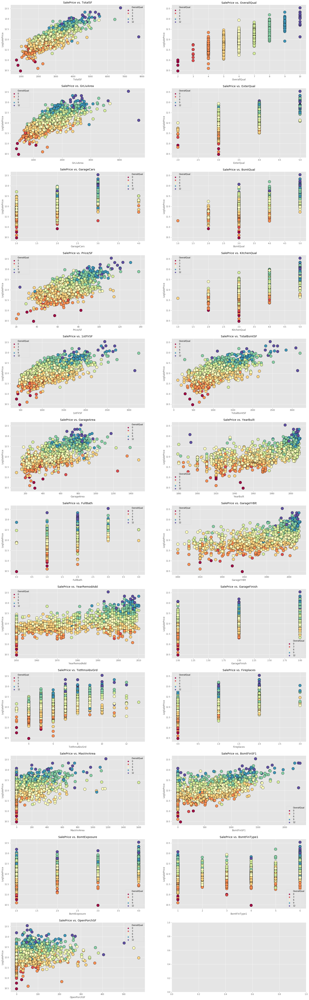

In [116]:
fig, axs = plt.subplots(12,2, figsize=(18, 60))
plt.subplots_adjust(right=1.3, top=1.3)
axs = axs.flatten()
for i, col in enumerate(list(sale_cors.index[2:25])):
    sns.scatterplot(y='LogSalePrice', x=col, s = 200,ax=axs[i],
                    hue = 'OverallQual',palette="Spectral",
                    edgecolor = 'black',data=train)
    axs[i].set_ylabel('LogSalePrice')
    axs[i].set_xlabel(col)
    axs[i].set_title(f'SalePrice vs. {col}')
plt.show()

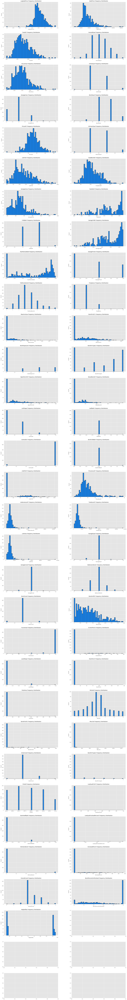

In [117]:
fig, axs = plt.subplots(32,2, figsize=(18, 60))
plt.subplots_adjust(right=1.3, top=3,wspace = .25,hspace = .25)
axs = axs.flatten()
for i, col in enumerate(list(sale_cors.index[:])):
    axs[i].hist(x=col,data=test,edgecolor = 'black',
                color = 'dodgerblue',linewidth = 2, bins = 50)
    axs[i].set_ylabel('Count')
    axs[i].set_xlabel(col)
    axs[i].set_title(f'{col} Frequency Distribution')

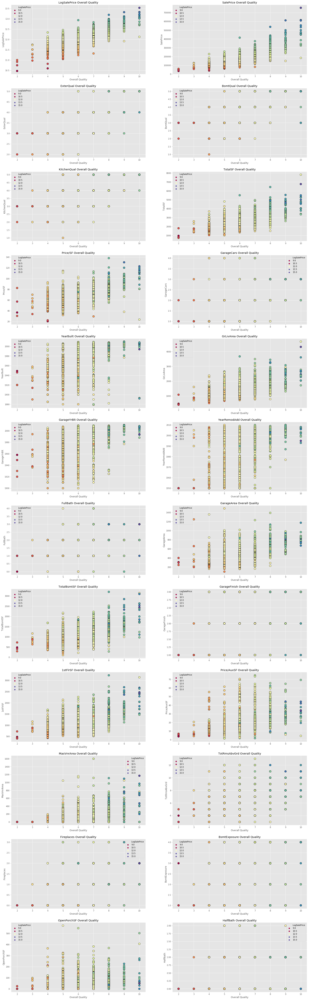

In [118]:
qual_cors = train_corr[['OverallQual']].sort_values(by = 'OverallQual', ascending = False)

fig, axs = plt.subplots(12,2, figsize=(18, 60))
plt.subplots_adjust(right=1.3, top=1.3)
axs = axs.flatten()
for i, col in enumerate(list(qual_cors.index[1:25])):
    sns.scatterplot(y=col, x='OverallQual',s=100 ,ax=axs[i],
                    hue = 'LogSalePrice',palette="Spectral",
                    edgecolor = 'black',data=train)
    axs[i].set_ylabel(col)
    axs[i].set_xlabel('Overall Quality')
    axs[i].set_title(f'{col} Overall Quality')
plt.show()

# Boxplots vs. Overall Quality

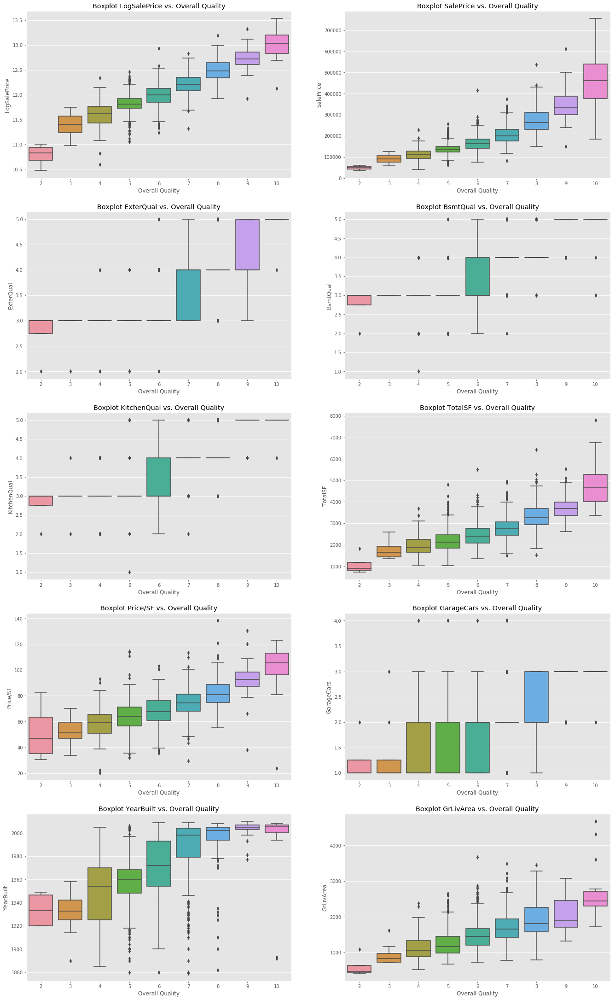

In [119]:
fig, axs = plt.subplots(int(np.ceil(len(qual_cors.index[1:11])/2)),2,figsize = (15,6))
plt.subplots_adjust(right=1.3, top=5)
axs = axs.flatten()
for i, col in enumerate(qual_cors.index[1:11]):
    sns.boxplot(x='OverallQual',y = col,ax=axs[i],data=train)
    axs[i].set_ylabel(f'{col}')
    axs[i].set_xlabel(f'Overall Quality')
    axs[i].set_title(f'Boxplot {col} vs. Overall Quality')
plt.show()

# Linear Model w/ Naive Feature Selection Based on Correlation w/ Sale Price Alone

In [120]:
import statsmodels.api as sm
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression

In [121]:
train.head()

,MapRefNo,Neighborhood,GrLivArea,MSSubClass,MSZoning,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,TotalSF,Price/SF,BsmtPercentUnfinished,LowQualFinishedPercent,TotalAuxSF,relativeAuxSF,Price/AuxSF,LogSalePrice
2467,535351050,NAmes,1363,1-STORY 1946 & NEWER ALL STYLES,RL,14559,Pave,0,Lvl,AllPub,Inside,1,Norm,Norm,1Fam,1Story,5,7,1951,2000,Hip,CompShg,Wd Sdng,Wd Sdng,BrkCmn,70.0,4,3,CBlock,3,3,1,4,650.0,3,180.0,178.0,1008.0,GasA,Ex,1,SBrkr,1363,0,0,1.0,0.0,1,0,2,1,3,6,7,2,CarPort,1951.0,1,1.0,288.0,3,3,Y,324,42,0,0,168,0,2000,6,2009,WD,Normal,164900,2371.0,69.548714,0.176587,0.0,15057.0,4324.532385,10.951717,12.013095
220,527325110,NWAmes,1969,2-STORY 1946 & NEWER,RL,11952,Pave,0,Lvl,AllPub,Inside,1,PosA,Norm,1Fam,2Story,7,6,1977,1977,Mansard,WdShake,WdShing,Plywood,None,0.0,3,3,CBlock,4,3,1,1,0.0,1,0.0,808.0,808.0,GasA,TA,1,SBrkr,1161,808,0,0.0,0.0,2,1,3,1,3,8,8,1,Attchd,1977.0,2,2.0,534.0,3,3,Y,0,0,0,0,276,0,0,11,2007,WD,Normal,190000,2777.0,68.419157,1.000000,0.0,12762.0,2029.532385,14.887949,12.154779
1101,908208020,Edwards,1121,1-STORY 1946 & NEWER ALL STYLES,RM,8546,Pave,0,Lvl,AllPub,Corner,1,Norm,Norm,1Fam,1Story,4,5,2003,2004,Gable,CompShg,VinylSd,VinylSd,None,0.0,3,3,PConc,4,3,1,1,0.0,1,0.0,1121.0,1121.0,GasA,Ex,1,SBrkr,1121,0,0,0.0,0.0,2,0,2,1,3,5,8,0,Attchd,2003.0,2,2.0,440.0,3,3,Y,132,64,0,0,0,0,0,3,2010,WD,Normal,140000,2242.0,62.444246,1.000000,0.0,9050.0,-1682.467615,15.469613,11.849398
58,528365060,NoRidge,2418,2-STORY 1946 & NEWER,RL,10542,Pave,0,Lvl,AllPub,Inside,1,Norm,Norm,1Fam,2Story,7,5,1993,1994,Hip,CompShg,Wd Sdng,ImStucc,BrkFace,651.0,4,3,PConc,4,3,4,6,1173.0,1,0.0,138.0,1311.0,GasA,Ex,1,SBrkr,1325,1093,0,1.0,0.0,2,1,3,1,4,9,8,1,Attchd,1993.0,2,3.0,983.0,3,3,Y,250,154,216,0,0,0,0,8,2008,WD,Normal,341000,3729.0,91.445428,0.105263,0.0,11895.0,1162.532385,28.667507,12.739638
1330,905427070,Edwards,2108,2-STORY 1945 & OLDER,RL,13728,Pave,0,Lvl,AllPub,Corner,1,Norm,Norm,1Fam,2Story,6,7,1935,1986,Hip,CompShg,Stucco,Stucco,None,0.0,3,3,CBlock,3,3,1,3,626.0,1,0.0,501.0,1127.0,GasA,Ex,1,SBrkr,1236,872,0,0.0,0.0,2,0,4,1,4,7,8,2,Basment,1935.0,1,2.0,540.0,3,3,Y,0,0,0,0,90,0,0,7,2008,WD,Normal,235000,3235.0,72.642968,0.444543,0.0,14358.0,3625.532385,16.367182,12.367341


Index(['TotalSF', 'OverallQual', 'GrLivArea', 'ExterQual', 'GarageCars',
       'BsmtQual'],
      dtype='object')
                            OLS Regression Results                            
Dep. Variable:           LogSalePrice   R-squared:                       0.830
Model:                            OLS   Adj. R-squared:                  0.829
Method:                 Least Squares   F-statistic:                     1534.
Date:                Thu, 02 Sep 2021   Prob (F-statistic):               0.00
Time:                        03:21:14   Log-Likelihood:                 920.66
No. Observations:                1899   AIC:                            -1827.
Df Residuals:                    1892   BIC:                            -1788.
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------

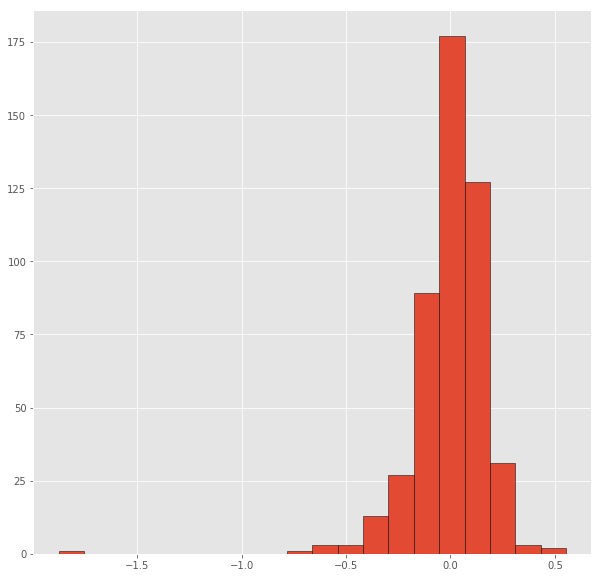

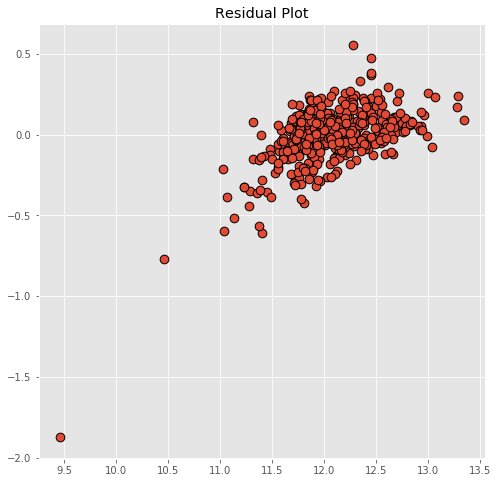

In [122]:
tr = train[sale_cors.index.to_numpy()[:8]]
ts = test[sale_cors.index.to_numpy()[:8]]

X_train = tr.drop(['LogSalePrice','SalePrice'], axis = 1)
X_test = ts.drop(['LogSalePrice','SalePrice'], axis = 1)
y_train = tr['LogSalePrice']
y_test = ts['LogSalePrice']

print(X_train.columns)

scaler = StandardScaler()
scaler.fit(X_train)
X_train_scaled = scaler.transform(X_train)
X_test_scaled =  scaler.transform(X_test)

#################################################################### statsmodels
X_add_const = sm.add_constant(X_train_scaled)
model = sm.OLS(y_train, X_add_const)
results = model.fit()
print(results.summary())

###################################################################### sklearn

lm = LinearRegression()
lm.fit(X_train_scaled, y_train)

##################################################################### diagnostic plots

residuals = y_test - lm.predict(X_test_scaled)
residuals.hist(bins = 20,figsize = (10,10),edgecolor = 'black')

fig, ax = plt.subplots()
fig.set_size_inches(8,8)
plt.scatter(x = y_test,y = residuals,edgecolors = 'black',linewidths = 1,s = 75)
plt.title('Residual Plot')
plt.show()

# Feature Selection with Lasso Regression:

In [123]:
from sklearn.linear_model import Lasso,Ridge,LassoLarsIC
from sklearn.model_selection import GridSearchCV

In [124]:
train.columns

Index(['MapRefNo', 'Neighborhood', 'GrLivArea', 'MSSubClass', 'MSZoning',
       'LotArea', 'Street', 'LotShape', 'LandContour', 'Utilities',
       'LotConfig', 'LandSlope', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath',
       'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual', 'TotRmsAbvGrd',
       'Functional', 'Fireplaces', 'GarageType', 'GarageYrBlt', 'GarageFinish',
       'GarageCars', 'GarageArea', 'GarageQual', 'GarageCond', 'PavedDrive',
       'WoodDeckSF', 'OpenPorchSF', '

In [125]:
tr = train[sale_cors.index.to_numpy()[:]]


ts = test[sale_cors.index.to_numpy()[:]]

X_train = tr.drop(['LogSalePrice','SalePrice','Price/AuxSF','Price/SF'], axis = 1)
X_test = ts.drop(['LogSalePrice','SalePrice','Price/AuxSF','Price/SF'], axis = 1)
y_train = tr['SalePrice']
y_test = ts['SalePrice']

scaler = StandardScaler()
scaler.fit(X_train)
X_train_scaled = scaler.transform(X_train)
X_test_scaled =  scaler.transform(X_test)


lasso = Lasso()

alpha_range = np.linspace(0,1000,1000)
lasso.set_params(normalize=False)
coefs_lasso  = []
scores = []

for alpha in alpha_range:
        lasso.set_params(alpha=alpha)
        lasso.fit(X_train,y_train)  
        coefs_lasso.append(lasso.coef_)
        scores.append(lasso.score(X_test,y_test))

coefs_lasso = pd.DataFrame(coefs_lasso, index = alpha_range, columns = X_train.columns)  
score_lasso = pd.DataFrame({'R^2':scores},index = alpha_range)


fig = px.line(coefs_lasso,x = coefs_lasso.index,
              y = coefs_lasso.columns,title = "Lasso Coefs vs. Lambda",
              range_x=(0,1000),height = 800,width = 1000)
fig.show()

fig = px.line(score_lasso,x = score_lasso.index,
              y = score_lasso['R^2'],title = "Lasso R^2 vs. Lambda",
              range_x=(0,1000),height = 800,width = 1000)
fig.show()